In [1]:

import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset
from os import listdir
from os.path import isfile, join
import json
from PIL import Image
import numpy as np
from torchvision.io import read_image
from torchvision.ops.boxes import masks_to_boxes
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection import keypointrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.faster_rcnn import TwoMLPHead
from torchvision.models.detection.faster_rcnn import RPNHead
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.keypoint_rcnn import KeypointRCNNHeads
from torchvision.models.detection.keypoint_rcnn import KeypointRCNNPredictor
from torchvision.ops import MultiScaleRoIAlign
import torch.nn.functional as FF
import torch.nn as nn
from torch import Tensor
from torchvision.models.detection.backbone_utils import BackboneWithFPN


In [2]:
class CustomDataset(Dataset):
    def __init__(self, image_folder, annotation_file, transform=None):
        self.imageFolderLen = 0
        self.image_folder = image_folder
        self.annotations = self.load_annotations(annotation_file)
        self.transform = transform

    def load_annotations(self, annotation_file):
        categoryLabels = []
        bboxLabels = []
        targets = []
        mypath = annotation_file
        onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
        i = 0
        for fileName in sorted(onlyfiles):
            f = open(mypath+fileName)
            dict1 = json.load(f)
            tmpBoxArr = []
            tmpKeypointsArr = []
            tmpCategoryArr = []
            for instance in dict1['annotations']:
                if instance["category_id"]==0:
                    tmpCategoryArr.append(2)
                else:
                    tmpCategoryArr.append(instance["category_id"])


                xmin = instance["bbox"][0] # image width is 1008 in the dataSet
                ymin = instance["bbox"][1] # image height is 756 in the dataSet
                xmax = instance["bbox"][2] # image width is 1008 in the dataSet
                ymax = instance["bbox"][3] # image height is 756 in the dataSet
                resizedbbox = [xmin,ymin,xmax,ymax]
                tmpBoxArr.append(resizedbbox)

                tmpKeypointsArr.append(np.array(instance["keypoints"]).reshape(-1,3))
            tmpTargets = {"boxes":tmpBoxArr,"labels":tmpCategoryArr,"image_id":[],"area":[],"iscrowd":[],"keypoints":tmpKeypointsArr}
            targets.append(tmpTargets)

        return targets

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        # Load image and annotations
#         image_path = os.path.join(self.image_folder, self.annotations[idx]['image_path'])
        onlyfiles = [f for f in listdir(self.image_folder) if isfile(join(self.image_folder, f))]
        onlyfiles = [ff for ff in sorted(onlyfiles)]
        self.imageFolderLen = len(onlyfiles)
        # image = Image.open().convert("RGB")

        img = read_image(self.image_folder+(onlyfiles[idx]))
        image = tv_tensors.Image(img)
        target = self.annotations[idx]
#         print(target["boxes"])
        target["labels"] = torch.Tensor(target["labels"]).to(dtype=torch.int64)
        target["boxes"] = tv_tensors.BoundingBoxes(target["boxes"], format="XYXY", canvas_size=F.get_size(img))
        target["keypoints"] = torch.Tensor(np.array(target["keypoints"])).to(dtype=torch.float32)
        target["image_id"] = torch.tensor([idx])
        target["area"] = (target["boxes"][:, 3] - target["boxes"][:, 1]) * (target["boxes"][:, 2] - target["boxes"][:, 0])
        target["iscrowd"] = torch.zeros(len(target["boxes"]), dtype=torch.int64)
#         # Apply transformations if available
        if self.transform is not None:
            image, target = self.transform(image,target)
#         bboxLabelsTarget

        return image, target

In [3]:
from torchvision.transforms import v2 as T
from google.colab import drive
import os

drive.mount('/content/drive')
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py")


def get_transform(train):
    transforms = []
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)

Mounted at /content/drive


In [4]:
from drive.MyDrive.roi_heads import RoIHeads
from drive.MyDrive.roi_heads import fastrcnn_loss,maskrcnn_loss,maskrcnn_inference,keypoints_to_heatmap,keypointrcnn_inference
from torchvision.ops import boxes as box_ops
import matplotlib.pyplot as plt


def keypointrcnn_loss(keypoint_logits, proposals, gt_keypoints, keypoint_matched_idxs):
    # type: (Tensor, List[Tensor], List[Tensor], List[Tensor]) -> Tensor
    N, K, H, W = keypoint_logits.shape
    if H != W:
        raise ValueError(
            f"keypoint_logits height and width (last two elements of shape) should be equal. Instead got H = {H} and W = {W}"
        )
    discretization_size = H
    heatmaps = []
    valid = []
    for proposals_per_image, gt_kp_in_image, midx in zip(proposals, gt_keypoints, keypoint_matched_idxs):
        kp = gt_kp_in_image[midx]
        heatmaps_per_image, valid_per_image = keypoints_to_heatmap(kp, proposals_per_image, discretization_size)
        heatmaps.append(heatmaps_per_image.view(-1))
        valid.append(valid_per_image.view(-1))

    keypoint_targets = torch.cat(heatmaps, dim=0)
    valid = torch.cat(valid, dim=0).to(dtype=torch.uint8)
    valid = torch.where(valid)[0]

    # accept empty tensors, so handle it sepaartely
    if keypoint_targets.numel() == 0 or len(valid) == 0:
        return keypoint_logits.sum() * 0

    keypoint_logits = keypoint_logits.reshape(N * K, H * W)
    keypoint_loss = FF.cross_entropy(keypoint_logits[valid], keypoint_targets[valid])
    return keypoint_loss

class CustomRoiHead(RoIHeads):

    def calculate_distances(self,point1, point2, grid_points):

        x1, y1 = point1
        x2, y2 = point2
        x_grid, y_grid = grid_points
        distance1 = np.sqrt((x_grid - x1)**2 + (y_grid - y1)**2)
        distance2 = np.sqrt((x_grid - x2)**2 + (y_grid - y2)**2)
        return distance1, distance2

    def create_feature_map(self,point1, point2, resolution=(10, 10)):

        # Generate grid of points
        x_vals = np.linspace(min(point1[0], point2[0]), max(point1[0], point2[0]), resolution[0])
        y_vals = np.linspace(min(point1[1], point2[1]), max(point1[1], point2[1]), resolution[1])
        X, Y = np.meshgrid(x_vals, y_vals)

        # Calculate distances of each point from both given points
        distances1, distances2 = self.calculate_distances(point1, point2, (X, Y))

        # Normalize distances based on the difference between them
        total_distances = distances1 + distances2
        normalized_distances = distances1 / total_distances

        return normalized_distances

    def guidingFeatureMapProducer(self,point1,point2,point3,offsetToAdd,resolution,show):
        point1 = point1.cpu().numpy()
        point2 = point2.cpu().numpy()
        point3 = point3.cpu().numpy()
        # Create feature map
        feature_map = self.create_feature_map(point1, point2, resolution=resolution)
        feature_map[feature_map<feature_map[int(point2[1])][int(point2[0])]]=0
        feature_map = feature_map*5
        if len(feature_map[feature_map>0])>0:
          minExcludingZeros = feature_map[feature_map>0].min()
        else:
          minExcludingZeros = 0
        feature_map-=minExcludingZeros
        feature_map[feature_map<0]= 0

        mn = feature_map[feature_map>0].mean()/2
        if len(feature_map[feature_map>0])>0:
            maxPixel = np.max(feature_map[feature_map>0])
            feature_map[feature_map>0]=maxPixel-feature_map[feature_map>0]+np.min(feature_map[feature_map>0])

        if len(feature_map[feature_map!=0])>0:
          feature_map[feature_map!=0] = 1


        if point3[0]-offsetToAdd<0:
            point3[0] = offsetToAdd
        if point3[1]-offsetToAdd<0:
            point3[1]=offsetToAdd

        if point3[0]+offsetToAdd>resolution[0]-1:
            point3[0]=resolution[0]-1
        if point3[1]-offsetToAdd>resolution[1]-1:
            point3[1]=resolution[0]-1

        topleftX = point3[0]-offsetToAdd
        topleftY = point3[1]-offsetToAdd
        flag = True

        if point3[0]-1<0:
          point3[0]=1

        if point3[0]+1>resolution[0]-1:
          point3[0]=resolution[0]-2

        if point3[1]-1<0:
          point3[1]=1
        if point3[1]+1>resolution[1]-1:
          point3[1]=resolution[1]-2


        if feature_map[int(point3[0]-1)][int(point3[1]-1)] == 0 or feature_map[int(point3[0]-1)][int(point3[1]+1)] == 0 or feature_map[int(point3[0]+1)][int(point3[1]-1)] == 0 or feature_map[int(point3[0]+1)][int(point3[1]+1)] == 0:
            flag = False


        if flag:
            feature_map[True] = 0
        for i in range(int(topleftX),int(topleftX+offsetToAdd)):
            for j in range(int(topleftY),int(topleftY+offsetToAdd)):
                if flag:
                    feature_map[i][j] = 1



        # if len(feature_map[feature_map==0])>0:
        #   feature_map[feature_map==0] = 1

        # feature_map[:,0:5]=0
        # feature_map[:,-5:]=0
        # feature_map[0:5,:]=0
        # feature_map[-5:,:]=0
        # zeromasks = feature_map==0
        # nonzeromasks = feature_map==1

        # if len(feature_map[zeromasks])>0:
        #   feature_map[zeromasks]=1
        # if len(feature_map[nonzeromasks])>0:
        #   feature_map[nonzeromasks]=0






        # if show==1:
        #   # # Plot heatmap
        #   plt.imshow(feature_map, cmap='gray')
        #   plt.scatter(point1[0], point1[1], color='blue')  # Plot points
        #   plt.scatter(point2[0], point2[1], color='red')  # Plot points

        #   plt.title('Feature Map Heatmap')
        #   plt.show()
        #   print("\n\n")


        return torch.tensor(feature_map).to(device)



    def guidingOffsetProducer(self,point1,point2,initialBox,offsetToAdd,resolution,show):
        condition = 5
      # point1 = tip
      # point2 = back

      # x and y are for tip
        point1 = point1.cpu().numpy()
        point2 = point2.cpu().numpy()
        x = point1[0]
        y = point1[1]

        # xp and yp are for back
        xp = point2[0]
        yp = point2[1]

#xmin ymin xmax ymax
        # if x-xp>=condition and np.absolute(y-yp)<=condition:
        #   initialBox = [initialBox[0]-offsetToAdd,initialBox[1],x,initialBox[3]]
        # elif x-xp<=-1*condition and np.absolute(y-yp)<=condition:
        #   initialBox = [x,initialBox[1],initialBox[2]+offsetToAdd,initialBox[3]]
        # elif np.absolute(x-xp)<=condition and y-yp>=condition:
        #   initialBox = [initialBox[0],initialBox[1]-offsetToAdd,initialBox[2],y]
        # elif np.absolute(x-xp)<=condition and y-yp<=-1*condition:
        #   initialBox = [initialBox[0],y,initialBox[2],initialBox[3]+offsetToAdd]
        # elif x-xp<=-1*condition and y-yp<=-1*condition:
        #   initialBox = [x,y,initialBox[2]+offsetToAdd,initialBox[3]+offsetToAdd]
        # elif x-xp>=condition and y-yp>=condition:
        #   initialBox = [initialBox[0]-offsetToAdd,initialBox[1]-offsetToAdd,x,y]
        # elif x-xp<=-1*condition and y-yp>=condition:
        #   initialBox = [x,initialBox[1]-offsetToAdd,initialBox[2]+offsetToAdd,y]
        # elif x-xp>=condition and y-yp<=-1*condition:
        #   initialBox = [initialBox[0]-offsetToAdd,y,x,initialBox[3]+offsetToAdd]

        if x-xp>=condition and np.absolute(y-yp)<=condition:
          initialBox = [initialBox[0]-offsetToAdd,initialBox[1],initialBox[2],initialBox[3]]
        elif x-xp<=-1*condition and np.absolute(y-yp)<=condition:
          initialBox = [initialBox[0],initialBox[1],initialBox[2]+offsetToAdd,initialBox[3]]
        elif np.absolute(x-xp)<=condition and y-yp>=condition:
          initialBox = [initialBox[0],initialBox[1]-offsetToAdd,initialBox[2],initialBox[3]]
        elif np.absolute(x-xp)<=condition and y-yp<=-1*condition:
          initialBox = [initialBox[0],initialBox[1],initialBox[2],initialBox[3]+offsetToAdd]
        elif x-xp<=-1*condition and y-yp<=-1*condition:
          initialBox = [initialBox[0],initialBox[1],initialBox[2]+offsetToAdd,initialBox[3]+offsetToAdd]
        elif x-xp>=condition and y-yp>=condition:
          initialBox = [initialBox[0]-offsetToAdd,initialBox[1]-offsetToAdd,initialBox[2],initialBox[3]]
        elif x-xp<=-1*condition and y-yp>=condition:
          initialBox = [initialBox[0],initialBox[1]-offsetToAdd,initialBox[2]+offsetToAdd,initialBox[3]]
        elif x-xp>=condition and y-yp<=-1*condition:
          initialBox = [initialBox[0]-offsetToAdd,initialBox[1],initialBox[2],initialBox[3]+offsetToAdd]
        return initialBox



    def subsample_array(self,arr, chunk_sizes):
      subsamples = []
      start_index = 0
      for size in chunk_sizes:
          end_index = start_index + size
          subsamples.append(arr[start_index:end_index, :, :,:])
          start_index = end_index
      return subsamples


    def postprocess_detections(
        self,
        class_logits,  # type: Tensor
        box_regression,  # type: Tensor
        proposals,  # type: List[Tensor]
        image_shapes,  # type: List[Tuple[int, int]]
    ):
        # type: (...) -> Tuple[List[Tensor], List[Tensor], List[Tensor]]
        device = class_logits.device
        num_classes = class_logits.shape[-1]

        boxes_per_image = [boxes_in_image.shape[0] for boxes_in_image in proposals]
        pred_boxes = self.box_coder.decode(box_regression, proposals)

        pred_scores = FF.softmax(class_logits, -1)

        pred_boxes_list = pred_boxes.split(boxes_per_image, 0)
        pred_scores_list = pred_scores.split(boxes_per_image, 0)

        all_boxes = []
        all_scores = []
        all_labels = []

        for boxes, scores, image_shape in zip(pred_boxes_list, pred_scores_list, image_shapes):
            boxes = box_ops.clip_boxes_to_image(boxes, image_shape)

            # create labels for each prediction
            labels = torch.arange(num_classes, device=device)
            labels = labels.view(1, -1).expand_as(scores)
            # remove predictions with the background label
            boxes = boxes[:, 1:]
            scores = scores[:, 1:]
            labels = labels[:, 1:]



            # batch everything, by making every class prediction be a separate instance
            boxes = boxes.reshape(-1, 4)
            scores = scores.reshape(-1)
            labels = labels.reshape(-1)


            # remove low scoring boxes
            inds = torch.where(scores > self.score_thresh)[0]
            boxes, scores, labels = boxes[inds], scores[inds], labels[inds]

            # remove empty boxes
            keep = box_ops.remove_small_boxes(boxes, min_size=1e-2)
            boxes, scores, labels = boxes[keep], scores[keep], labels[keep]

            # non-maximum suppression, independently done per class
            keep = box_ops.batched_nms(boxes, scores, labels, self.nms_thresh)
            # keep only topk scoring predictions
            keep = keep[: self.detections_per_img]
            boxes, scores, labels = boxes[keep], scores[keep], labels[keep]

            all_boxes.append(boxes)
            all_scores.append(scores)
            all_labels.append(labels)

        return all_boxes, all_scores, all_labels

    def forward(self, features, proposals, image_shapes,targets=None):
        # print(proposals,"\n")
        if targets is not None:
                    for t in targets:
                        # TODO: https://github.com/pytorch/pytorch/issues/26731
                        floating_point_types = (torch.float, torch.double, torch.half)
                        if not t["boxes"].dtype in floating_point_types:
                            raise TypeError(f"target boxes must of float type, instead got {t['boxes'].dtype}")
                        if not t["labels"].dtype == torch.int64:
                            raise TypeError(f"target labels must of int64 type, instead got {t['labels'].dtype}")
                        if self.has_keypoint():
                            if not t["keypoints"].dtype == torch.float32:
                                raise TypeError(f"target keypoints must of float type, instead got {t['keypoints'].dtype}")

        if self.training:
            proposals, matched_idxs, labels, regression_targets = self.select_training_samples(proposals, targets)
            # print(labels[0].shape,len(labels))
        else:
            labels = None
            regression_targets = None
            matched_idxs = None
        # print([t["boxes"] for t in targets],"\n\n")
        box_features = self.box_roi_pool(features, proposals, image_shapes)
        box_features = self.box_head(box_features)
        class_logits, box_regression = self.box_predictor(box_features)

        result: List[Dict[str, torch.Tensor]] = []
        losses = {}
        if self.training:
            if labels is None:
                raise ValueError("labels cannot be None")
            if regression_targets is None:
                raise ValueError("regression_targets cannot be None")
            loss_classifier, loss_box_reg = fastrcnn_loss(class_logits, box_regression, labels, regression_targets)
            losses = {"loss_classifier": loss_classifier, "loss_box_reg": loss_box_reg}
        else:
            boxes, scores, labels = self.postprocess_detections(class_logits, box_regression, proposals, image_shapes)
            num_images = len(boxes)
            for i in range(num_images):
                result.append(
                    {
                        "boxes": boxes[i],
                        "labels": labels[i],
                        "scores": scores[i],
                    }
                )

        if self.has_mask():
            mask_proposals = [p["boxes"] for p in result]
            if self.training:
                if matched_idxs is None:
                    raise ValueError("if in training, matched_idxs should not be None")

                # during training, only focus on positive boxes
                num_images = len(proposals)
                mask_proposals = []
                pos_matched_idxs = []
                for img_id in range(num_images):
                    pos = torch.where(labels[img_id] > 0)[0]
                    mask_proposals.append(proposals[img_id][pos])
                    pos_matched_idxs.append(matched_idxs[img_id][pos])
            else:
                pos_matched_idxs = None

            if self.mask_roi_pool is not None:
                mask_features = self.mask_roi_pool(features, mask_proposals, image_shapes)
                mask_features = self.mask_head(mask_features)
                mask_logits = self.mask_predictor(mask_features)
            else:
                raise Exception("Expected mask_roi_pool to be not None")

            loss_mask = {}
            if self.training:
                if targets is None or pos_matched_idxs is None or mask_logits is None:
                    raise ValueError("targets, pos_matched_idxs, mask_logits cannot be None when training")

                gt_masks = [t["masks"] for t in targets]
                gt_labels = [t["labels"] for t in targets]
                rcnn_loss_mask = maskrcnn_loss(mask_logits, mask_proposals, gt_masks, gt_labels, pos_matched_idxs)
                loss_mask = {"loss_mask": rcnn_loss_mask}
            else:
                labels = [r["labels"] for r in result]
                masks_probs = maskrcnn_inference(mask_logits, labels)
                for mask_prob, r in zip(masks_probs, result):
                    r["masks"] = mask_prob

            losses.update(loss_mask)

        # keep none checks in if conditional so torchscript will conditionally
        # compile each branch
        if (
            self.keypoint_roi_pool is not None
            and self.keypoint_head is not None
            and self.keypoint_predictor is not None
        ):
            keypoint_proposals = [p["boxes"] for p in result]
            if self.training:
                # during training, only focus on positive boxes
                num_images = len(proposals)
                keypoint_proposals = []
                pos_matched_idxs = []
                if matched_idxs is None:
                    raise ValueError("if in trainning, matched_idxs should not be None")

                for img_id in range(num_images):
                    pos = torch.where(labels[img_id] > 0)[0]
                    keypoint_proposals.append(proposals[img_id][pos])
                    pos_matched_idxs.append(matched_idxs[img_id][pos])
            else:
                pos_matched_idxs = None

            offset = torch.tensor([-0,-0,0,0]).to(device)
            keypoint_proposals_withNoOffest = []
            for someTensor in keypoint_proposals:
                keypoint_proposals_withNoOffest.append(someTensor+offset)


            keypoint_features = self.keypoint_roi_pool(features, keypoint_proposals_withNoOffest, image_shapes)
            keypoint_features_copied = keypoint_features
            # print(keypoint_features_copied.shape)
            keypoint_features = self.keypoint_head(keypoint_features)
            keypoint_logits = self.keypoint_predictor(keypoint_features)






# comment the code below when training the initial baseline model and uncomment it to train the Guided-Head
            keypoint_logits_OldHead = keypoint_logits
            offset = torch.tensor([-0,-0,0,0]).to(device)
            keypoint_proposals_withOffest = []
            for someTensor in keypoint_proposals:
                keypoint_proposals_withOffest.append(someTensor+offset)
            chunk_sizes = [i.shape[0] for i in keypoint_proposals_withNoOffest]
            # Subsample the array into chunks
            subsamples = self.subsample_array(keypoint_logits_OldHead, chunk_sizes)
            tensor_list = []
            for i in range(len(subsamples)):
                keypoints_probs, kp_scores = keypointrcnn_inference(subsamples[i], [keypoint_proposals_withNoOffest[i]])
                for j,counter in zip(keypoints_probs[0][:,0:3,0:2],range(len(keypoint_proposals_withNoOffest[i]))):
                    backPointXY = j[1,:]
                    tipPointXY = j[2,:]
                    scalingFactor1=224
                    scalingFactor2=224
                    updatedBox = self.guidingOffsetProducer(tipPointXY,backPointXY,keypoint_proposals_withNoOffest[i][counter],20,(scalingFactor1,scalingFactor2),show=1)
                    keypoint_proposals_withOffest[i][counter] = torch.tensor(updatedBox)
            keypoint_features_guided = self.keypoint_roi_pool_guided(features, keypoint_proposals_withOffest, image_shapes)
            guidedFeatureMap = self.keypoint_head_guided(keypoint_features_guided)
            keypoint_logits = self.keypoint_predictor_guided(guidedFeatureMap)
# end of comment area





            if self.training:
              print("-- -- -- -- -- --")
            loss_keypoint = {}
            if self.training:
                if targets is None or pos_matched_idxs is None:
                    raise ValueError("both targets and pos_matched_idxs should not be None when in training mode")

                gt_keypoints = [t["keypoints"] for t in targets]



# comment the code below when training the initial baseline model and uncomment it to train the Guided-Head
                gt_keypoints_old = []
                for i in range(len(gt_keypoints)):
                    gt_keypoints_old.append(gt_keypoints[i][:,1:,:])
                gt_keypoints_guided = []
                for i in range(len(gt_keypoints)):
                    gt_keypoints_guided.append(gt_keypoints[i][:,0,:].reshape(-1,1,3))
                rcnn_loss_keypoint_old = keypointrcnn_loss(
                    keypoint_logits_OldHead[:,1:], keypoint_proposals_withNoOffest, gt_keypoints_old, pos_matched_idxs
                )
                rcnn_loss_keypoint_guided = keypointrcnn_loss(
                    keypoint_logits[:,0].reshape(-1,1,56,56), keypoint_proposals_withOffest, gt_keypoints_guided, pos_matched_idxs
                )
                loss_keypoint = {"loss_keypoint": rcnn_loss_keypoint_guided}
# end of comment area



# uncomment the code below when training the initial baseline model and comment it to train the Guided-Head
                # rcnn_loss_keypoint = keypointrcnn_loss(
                #     keypoint_logits, keypoint_proposals_withNoOffest, gt_keypoints, pos_matched_idxs
                # )
                # loss_keypoint = {"loss_keypoint": rcnn_loss_keypoint}
# end of comment area


            else:
                if keypoint_logits is None or keypoint_proposals_withNoOffest is None:
                    raise ValueError(
                        "both keypoint_logits and keypoint_proposals_withOffest should not be None when not in training mode"
                    )

# uncomment the code below when training the initial baseline model and comment it to train the Guided-Head
                # keypoints_probs, kp_scores = keypointrcnn_inference(keypoint_logits, keypoint_proposals_withNoOffest)
                # keypoints_probs, kp_scores = keypointrcnn_inference(torch.cat((keypoint_logits[:,0].reshape(-1,1,56,56), keypoint_logits_OldHead[:,1:]), dim=1), keypoint_proposals_withOffest)
# end of comment area




# comment the code below when training the initial baseline model and uncomment it to train the Guided-Head
                keypoints_probs_OldHead, kp_scores_OldHead = keypointrcnn_inference(keypoint_logits_OldHead, keypoint_proposals_withNoOffest)
                keypoints_probs_GuidedHead, kp_scores_GuidedHead= keypointrcnn_inference(keypoint_logits, keypoint_proposals_withOffest)

                keypoints_probs = []
                keypoints_probs.append(torch.cat((keypoints_probs_GuidedHead[0][:,0,:].reshape(-1,1,3), keypoints_probs_OldHead[0][:,1:,:]),dim=1))

                kp_scores = []
                kp_scores.append(torch.cat((kp_scores_GuidedHead[0][:,0].reshape(-1,1), kp_scores_OldHead[0][:,1:]),dim=1))
# end of comment area






                for keypoint_prob, kps, r in zip(keypoints_probs, kp_scores, result):
                    r["keypoints"] = keypoint_prob
                    r["keypoints_scores"] = kps
            losses.update(loss_keypoint)

        return result, losses

In [5]:
from torchvision.models.detection import KeypointRCNN

# for ResNet18 based model
# backbone = resnet_fpn_backbone(backbone_name = "resnet18", pretrained = True)


# for mobilenet_v3 based model
# backbone = torchvision.models.mobilenet_v3_small(pretrained=True).features
# backbone[-1][0] = nn.Conv2d(in_channels=96, out_channels=256, kernel_size=1, stride=1, padding=0)
# backbone[-1][1] = nn.BatchNorm2d(256,eps=0.001, momentum=0.01)


# for shufflenet_v2_x0_5
backbone = torchvision.models.shufflenet_v2_x0_5(pretrained=True)
backbone = nn.Sequential(*list(backbone.children())[:-1])
backbone[-1][0] = nn.Conv2d(in_channels=192, out_channels=256, kernel_size=1, stride=1, padding=0)
backbone[-1][1] = nn.BatchNorm2d(256)
backbone[-1][2] = nn.ReLU(inplace=True)


# for shufflenet_v2_x1_0
# backbone = torchvision.models.shufflenet_v2_x1_0(pretrained=True)
# backbone = nn.Sequential(*list(backbone.children())[:-1])
# backbone[-1][0] = nn.Conv2d(in_channels=464, out_channels=256, kernel_size=1, stride=1, padding=0)
# backbone[-1][1] = nn.BatchNorm2d(256)
# backbone[-1][2] = nn.ReLU(inplace=True)





# # for ResNet18 based and MobileNetV3 based model
# model = torchvision.models.detection.keypointrcnn_resnet50_fpn(pretrained=False,
#                                                                    pretrained_backbone=True,
#                                                                    num_keypoints=5,num_classes = 3)


# run the remainder of this block for shufflenet_v2_x1_0 and shufflenet_v2_x0_5
anchor_generator = AnchorGenerator(
        sizes=((128,256,512),),
        aspect_ratios=((0.5, 1.0, 2.0),),
)
backbone.out_channels = 256
model = KeypointRCNN(
      backbone,
      num_classes=3,
      num_keypoints=5,
      rpn_anchor_generator=anchor_generator,
      box_roi_pool=torchvision.ops.MultiScaleRoIAlign(featmap_names=["0"], output_size=7, sampling_ratio=2),
      keypoint_roi_pool=torchvision.ops.MultiScaleRoIAlign(featmap_names=["0"], output_size=14, sampling_ratio=2)
  )



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X0_5_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X0_5_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/shufflenetv2_x0.5-f707e7126e.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x0.5-f707e7126e.pth
100%|██████████| 5.28M/5.28M [00:00<00:00, 28.2MB/s]


In [6]:
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features,3)

In [ ]:
backbone

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 58, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(58, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 58, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(58, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [ ]:
sum(p.numel() for p in backbone.parameters())

895972

In [37]:
# model.backbone = BackboneWithFPN(backbone,return_layers={"3":"0","6":"1","8":"2","12":"3"},in_channels_list=[24,40,48,256],out_channels=256) # for mobilenet_v3_small based model

# model.backbone = backbone # for ResNet18 based model


In [ ]:
model

KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
            (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(16,

In [7]:
# box_roi_pool = torchvision.ops.MultiScaleRoIAlign(featmap_names=["0", "1", "2", "3"], output_size=7, sampling_ratio=2)
box_roi_pool = torchvision.ops.MultiScaleRoIAlign(featmap_names=["0"], output_size=7, sampling_ratio=2)

resolution = box_roi_pool.output_size[0]
representation_size = 1024
# box_head = TwoMLPHead(256 * resolution**2, representation_size)
box_head = TwoMLPHead(256 * resolution**2, representation_size)

representation_size = 1024
box_predictor = FastRCNNPredictor(representation_size, 3)

model.roi_heads = CustomRoiHead(
            # Box
            box_roi_pool,
            box_head,
            box_predictor,
            0.5,
            0.5,
            512,
            0.25,
            None,
            0.05,
            0.5,
            100,
        )

# model.roi_heads.keypoint_roi_pool = MultiScaleRoIAlign(featmap_names=["0", "1", "2", "3"], output_size=14, sampling_ratio=2)
model.roi_heads.keypoint_roi_pool = MultiScaleRoIAlign(featmap_names=["0"], output_size=14, sampling_ratio=2)




In [8]:
keypoint_layers = tuple(512 for _ in range(2))
# out_channels = backbone.out_channels
out_channels=256

model.roi_heads.keypoint_head = KeypointRCNNHeads(out_channels, keypoint_layers)

keypoint_dim_reduced = 512
model.roi_heads.keypoint_predictor = KeypointRCNNPredictor(keypoint_dim_reduced, 5)

In [9]:
# adding the Guided head here
for param in model.parameters():
    param.requires_grad = False

model.roi_heads.keypoint_roi_pool_guided = MultiScaleRoIAlign(featmap_names=["0"], output_size=14, sampling_ratio=2)
model.roi_heads.keypoint_head_guided = KeypointRCNNHeads(out_channels, keypoint_layers)
keypoint_dim_reduced = 512
model.roi_heads.keypoint_predictor_guided = KeypointRCNNPredictor(keypoint_dim_reduced, 5)

# # train on the GPU or on the CPU, if a GPU is not available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model.to(device)


KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (2): Sequential(
      (0): InvertedResidual(
        (branch1): Sequential(
          (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
          (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_runnin

In [ ]:
sum(p.numel() for p in model.parameters())

21867622

In [ ]:
for param in model.parameters():
    print(param.requires_grad)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

In [10]:
from engine import train_one_epoch, evaluate
import utils

num_classes = 3
# use our dataset and defined transformations

dataset = CustomDataset(image_folder='/content/drive/MyDrive/StrawDI_Db1/train/img/', annotation_file='/content/drive/MyDrive/StrawDI_Db1/annotations/SDI_annotations/train/json/', transform=get_transform(train=True))
dataset_test = CustomDataset(image_folder='/content/drive/MyDrive/StrawDI_Db1/val/img/', annotation_file='/content/drive/MyDrive/StrawDI_Db1/annotations/SDI_annotations/val/json/', transform=get_transform(train=False))

In [11]:
import math
import sys
import time
def train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq,scheduler=None, scaler=None):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", utils.SmoothedValue(window_size=1, fmt="{value:.6f}"))
    header = f"Epoch: [{epoch}]"

    lr_scheduler = None
    # if epoch == 0:
    #     warmup_factor = 1.0 / 1000
    #     warmup_iters = min(1000, len(data_loader) - 1)
    #     lr_scheduler = torch.optim.lr_scheduler.LinearLR(
    #         optimizer, start_factor=warmup_factor, total_iters=warmup_iters
    #     )
    #     # lr_scheduler = scheduler


    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]
        with torch.cuda.amp.autocast(enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = utils.reduce_dict(loss_dict)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()
        if not math.isfinite(loss_value):
            print(f"Loss is {loss_value}, stopping training")
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses_reduced, **loss_dict_reduced)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

    return metric_logger

In [12]:
from torch.optim.lr_scheduler import StepLR
# define training and validation data loaders

data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=12,
    shuffle=True,
    num_workers=4,
    collate_fn=utils.collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size=1,
    shuffle=False,
    num_workers=4,
    collate_fn=utils.collate_fn
)

# get the model using our helper function
# model = get_model_instance_segmentation(num_classes)

# move model to the right device
model.to(device)

# # and a learning rate scheduler
# lr_scheduler = torch.optim.lr_scheduler.StepLR(
#     optimizer,
#     step_size=3,
#     gamma=0.1
# )

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (2): Sequential(
      (0): InvertedResidual(
        (branch1): Sequential(
          (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
          (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_runnin

In [13]:
# i = 0
# image = out[0][i]
import matplotlib.pyplot as plt
# !pip install PyGame
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from PIL import Image
import torchvision.transforms as transforms
# take picture
from torchvision.ops import nms

import cv2


def box_iou(box1, box2):

    # Calculate intersection area
    x1 = torch.max(box1[:, None, 0], box2[:, 0])
    y1 = torch.max(box1[:, None, 1], box2[:, 1])
    x2 = torch.min(box1[:, None, 2], box2[:, 2])
    y2 = torch.min(box1[:, None, 3], box2[:, 3])

    inter = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    # Calculate area of both boxes
    area1 = (box1[:, 2] - box1[:, 0]) * (box1[:, 3] - box1[:, 1])
    area2 = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])

    # Calculate union area
    union = area1[:, None] + area2 - inter

    # Compute IoU
    iou = inter / union
    return iou

def testFN(batchInxShowStart=0,batchInxShowEnd=1,ShowTestImage=True,ShowLog=True):
    print("Test Started")
    testSetTruePreds = 0
    acceptablePredictionsInDataset = 0.00001
    sumOfPxlwiseError = 0

    # try:
    for batchInx,(image,label) in enumerate(data_loader):
        image = image[0]
        transform = transforms.Compose([
            transforms.ToTensor(),
            # Add more transforms if needed
        ])

        eval_transform = get_transform(train=False)

        model.eval()
        with torch.no_grad():
            x = eval_transform(image)
            # convert RGBA -> RGB and move to device
            x = x[:3, ...].to(device)
            predictions = model([x, ])
            pred = predictions[0]


        image = (255.0 * (image - image.min()) / (image.max() - image.min())).to(torch.uint8)

        image = image[:3, ...]




        scoreMask = pred["scores"]>0.5

        pred_labels = ["" for label, score in zip(pred["labels"][scoreMask], pred["scores"][scoreMask])]
        pred_boxes = (pred["boxes"][scoreMask]*(torch.Tensor([1,1,1,1])).to(device)).long()


        keep = nms(pred_boxes.float(), pred["scores"][scoreMask], iou_threshold=0.5)

        finalBoxes = pred_boxes[keep]+torch.Tensor([-0,-0,0,0]).to(device)

        # print(batchInx)
        # print(finalBoxes)
        # print(label[0]["boxes"])

        iou_threshold = 0.5
        iou_matrix = box_iou(finalBoxes.cpu(),label[0]["boxes"])
        masked_iou_matrix = torch.where(iou_matrix >= iou_threshold, iou_matrix, torch.tensor(float('-inf')))

        try:
            label2PredsBoxMatching = [int(torch.argmax(col)) if torch.max(col) != float('-inf') else float('-inf') for col in masked_iou_matrix.T]
        except:
          continue
        # print(label2PredsBoxMatching)


        try:
          finalLabels = np.array(pred_labels)[np.array(keep.tolist())]
        except:
          continue
        # print(finalBoxes[:,2]-finalBoxes[:,0],finalBoxes[:,3]-finalBoxes[:,1])
        # print(finalBoxes[:,0],"\n",finalBoxes[:,1],"\n",finalBoxes[:,2],"\n",finalBoxes[:,3])
        output_image = draw_bounding_boxes(image,finalBoxes , finalLabels, colors="red")

        keypointsToPlot = np.array([point[:2].cpu() for keypoints in predictions[0]["keypoints"][keep.tolist()] for point in keypoints])
        # print(keypointsToPlot.reshape(-1,5,2)[:,0])
        # plt.figure(figsize=(10, 10))
        # plt.imshow(output_image.permute(1, 2, 0))

    # evaluator
        allPredictedKeypoints = keypointsToPlot.reshape(-1,5,2)[:,0]
        allLabelKeypoints = label[0]["keypoints"][:,0,:2]
        perImagelabelkeycounter = 0
        perImagetruePreds = 0
        flag = 0
        for labelPoint in enumerate(allLabelKeypoints):
          if label2PredsBoxMatching[labelPoint[0]] != float('-inf'):
            if labelPoint[1][0]!=0 or labelPoint[1][1]!=0:
              KeypointPredictedMatched = allPredictedKeypoints[label2PredsBoxMatching[labelPoint[0]]]
              pxlwiseDistanceForStraberry = np.sqrt((KeypointPredictedMatched[0]-labelPoint[1][0])**2 + (KeypointPredictedMatched[1]-labelPoint[1][1])**2)
              sumOfPxlwiseError+=pxlwiseDistanceForStraberry
              acceptablePredictionsInDataset+=1
              if pxlwiseDistanceForStraberry < 25:
                  testSetTruePreds+=1
              else:
                flag=1
                continue
              if ShowLog:
                print(pxlwiseDistanceForStraberry)


        if(batchInx>= batchInxShowStart and batchInx<batchInxShowEnd and ShowTestImage):
            plt.figure(figsize=(10, 10))
            plt.imshow(output_image.permute(1, 2, 0))
            plt.scatter(keypointsToPlot.reshape(-1,5,2)[:,3:, 0], keypointsToPlot.reshape(-1,5,2)[:,3:, 1], s=15, c='r', marker='o')  # Assuming keypointsToPlot is Nx2 array
            plt.scatter(keypointsToPlot.reshape(-1,5,2)[:,0, 0], keypointsToPlot.reshape(-1,5,2)[:,0, 1], s=15, c='purple', marker='o')  # Assuming keypointsToPlot is Nx2 array
            plt.scatter(keypointsToPlot.reshape(-1,5,2)[:,1, 0], keypointsToPlot.reshape(-1,5,2)[:,1, 1], s=20, c='g', marker='o')  # Assuming keypointsToPlot is Nx2 array
            plt.scatter(keypointsToPlot.reshape(-1,5,2)[:,2, 0], keypointsToPlot.reshape(-1,5,2)[:,2, 1], s=15, c='white', marker='o')  # Assuming keypointsToPlot is Nx2 array
            plt.scatter(label[0]["keypoints"][:,0,0], label[0]["keypoints"][:,0,1], s=10, c='b', marker='o')  # Assuming keypointsToPlot is Nx2 array
            # print(batchInx)



    # evaluator end

        # print(allPredictedKeypoints)
        # print(allLabelKeypoints)

        # plt.scatter(keypointsToPlot[:, 0], keypointsToPlot[:, 1], s=10, c='r', marker='o')  # Assuming keypointsToPlot is Nx2 array
        # plt.scatter(label[0]["keypoints"][:,0,0], label[0]["keypoints"][:,0,1], s=10, c='b', marker='o')  # Assuming keypointsToPlot is Nx2 array
        # break
        if batchInx>142:
          break
    # except:
    print("Test Ended")
    return testSetTruePreds,acceptablePredictionsInDataset,sumOfPxlwiseError


<ipython-input-16-865744b71ab2>:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):
<ipython-input-21-3ac5d076514b>:546: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  keypoint_proposals_withOffest[i][counter] = torch.tensor(updatedBox)


Streaming output truncated to the last 5000 lines.
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
Epoch: [2]  [170/234]  eta: 0:04:04  lr: 0.000192  loss: 6.0692 (6.1491)  loss_classifier: 0.0632 (0.0642)  loss_box_reg: 0.1005 (0.1048)  loss_keypoint: 5.8356 (5.8663)  loss_objectness: 0.0327 (0.0414)  loss_rpn_box_reg: 0.0616 (0.0725)  time: 3.1852  data: 2.0115  max mem: 4036
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
Epoch: [2]  [175/234]  eta: 0:03:43  lr: 0.000192  loss: 6.1642 (6.1552)  loss_classifier: 0.0613 (0.0641)  loss_box_reg: 0.0997 (0.1047)  loss_keypoint: 5.8991 (5.8727)  loss_objectness: 0.0327 (0.0414)  loss_rpn_box_reg: 0.0605 (0.0723)  time: 3.1014  data: 1.9811  max mem: 4036
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
-- -- -- -- -- --
Epoch: [2]  [180/234]  eta: 0:03:30  lr: 0.000192  loss: 6.2644 (6.1571)  loss_classifier: 0.0619 (0.0642)  loss_box_reg: 0.1053 (0.1051)  loss_keypoin

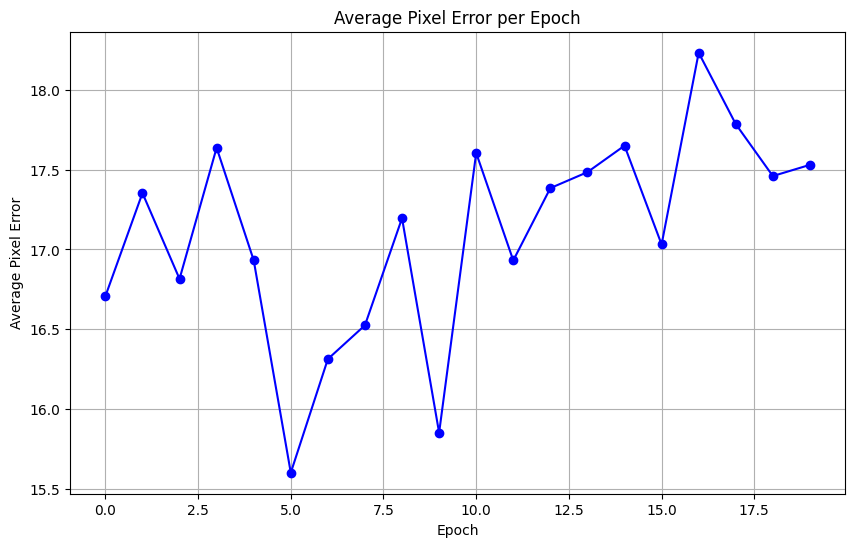

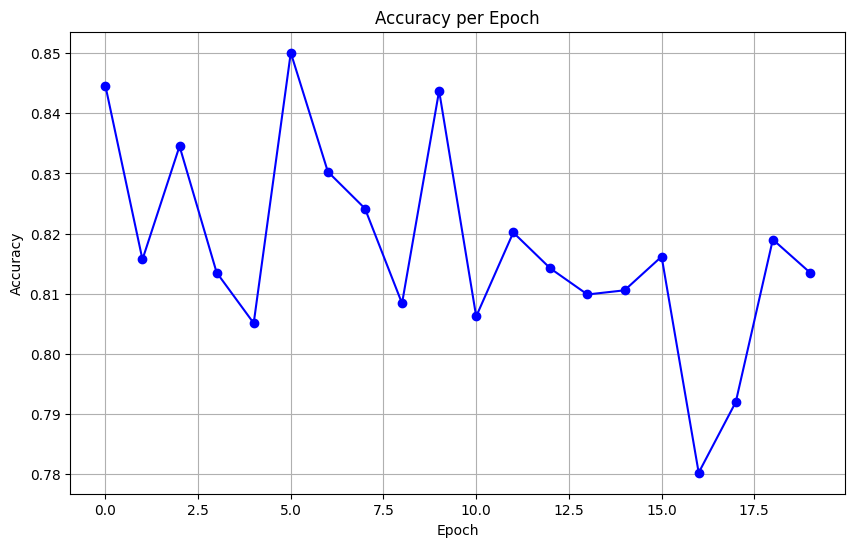

[tensor(16.7072), tensor(17.3536), tensor(16.8157), tensor(17.6373), tensor(16.9324), tensor(15.6015), tensor(16.3136), tensor(16.5253), tensor(17.1961), tensor(15.8520), tensor(17.6048), tensor(16.9315), tensor(17.3846), tensor(17.4846), tensor(17.6504), tensor(17.0316), tensor(18.2328), tensor(17.7857), tensor(17.4602), tensor(17.5303)]
[0.844606931542835, 0.815693415772018, 0.8345454393719012, 0.8135283215077089, 0.8051001674845143, 0.8500913921372689, 0.8302919556516067, 0.8241758090810292, 0.8083941458322237, 0.84374998448989, 0.8062157073817969, 0.8201834711892941, 0.8142076354424839, 0.809872014444753, 0.8105646482592961, 0.8161764555849916, 0.7802197659300409, 0.7919707884676864, 0.819012782102143, 0.8135283215077089]


In [ ]:
# training phase - select the best model
#### DO NOT Run this block for inference

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
# Set up the Adam optimizer
optimizer = torch.optim.Adam(
    params,
    lr=0.0002,
    weight_decay=0.0001
)
scheduler = StepLR(optimizer, step_size=1, gamma=0.98)


# let's train it for 5 epochs
num_epochs = 20
averagePxlError = True
listOfAveragePxlErrors = []
listOfAccuracy = []
try:
  for epoch in range(num_epochs):


        train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=5)
        testSetTruePreds,acceptablePredictionsInDataset,sumOfPxlwiseError = testFN(0,1,False,False)
        print(testSetTruePreds/acceptablePredictionsInDataset)
        listOfAveragePxlErrors.append(sumOfPxlwiseError/acceptablePredictionsInDataset)
        listOfAccuracy.append(testSetTruePreds/acceptablePredictionsInDataset)
        print("This Epochs AveragePlxError Test",sumOfPxlwiseError/acceptablePredictionsInDataset)

        if averagePxlError==True:
          averagePxlError = sumOfPxlwiseError/acceptablePredictionsInDataset
        else:
          if (sumOfPxlwiseError/acceptablePredictionsInDataset)<averagePxlError:
            averagePxlError = sumOfPxlwiseError/acceptablePredictionsInDataset
            # uncomment the code below to save the best model somewhere
            # torch.save(model.state_dict(), "/content/drive/MyDrive/shufflenet_v2_x0_5NotGuided20OffsetBestEpoch2Layerslr0002weight_decay0.0001gamma0_98.h5")

        print("Best Epochs AveragePlxError Test",averagePxlError)
        print(sumOfPxlwiseError,acceptablePredictionsInDataset)

        scheduler.step()

        #   # evaluate on the test dataset
        #   evaluate(model, data_loader_test, device=device)
except:
  print("That's it!")
finally:
  plt.figure(figsize=(10, 6))
  plt.plot(range(len(listOfAveragePxlErrors)),listOfAveragePxlErrors, marker='o', linestyle='-', color='b')
  plt.xlabel('Epoch')
  plt.ylabel('Average Pixel Error')
  plt.title('Average Pixel Error per Epoch')
  plt.grid(True)
  plt.show()


  plt.figure(figsize=(10, 6))
  plt.plot(range(len(listOfAccuracy)),listOfAccuracy, marker='o', linestyle='-', color='b')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.title('Accuracy per Epoch')
  plt.grid(True)
  plt.show()
  print(listOfAveragePxlErrors)
  print(listOfAccuracy)

In [ ]:
# torch.save(model.state_dict(), "/content/drive/MyDrive/shufflenet_v2_x1_0NotGuided50Offset_ONE_DIRECTION_3Epochs2Layerslr0003.h5")

In [14]:
# load the saved weights of the model
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.load_state_dict(torch.load("/content/drive/MyDrive/shufflenet_v2_x0_5Guided20.h5",map_location=torch.device('cpu')))
model.eval()
model.to(device)

<ipython-input-14-2da8e1ad64a5>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/drive/MyDrive/shufflenet_v2_x0_5NotGuided20Offset

KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (2): Sequential(
      (0): InvertedResidual(
        (branch1): Sequential(
          (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
          (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_runnin

Test Started
tensor(3.4978)
tensor(9.0147)
tensor(22.5444)
tensor(8.8750)
tensor(3.0021)
tensor(8.1311)
tensor(7.5775)
tensor(8.3666)
tensor(5.5968)
tensor(3.6291)
tensor(6.2265)
tensor(7.6424)
tensor(10.8488)
tensor(16.8986)
tensor(3.0075)
tensor(18.3008)
tensor(10.1868)
tensor(17.4649)
tensor(10.6292)
tensor(5.0018)
tensor(20.9219)
tensor(10.4117)
tensor(5.9696)
tensor(9.2890)
tensor(4.2323)
tensor(9.2629)
tensor(22.4520)
tensor(24.4366)


<ipython-input-4-91174c2b1d4c>:431: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  keypoint_proposals_withOffest[i][counter] = torch.tensor(updatedBox)


tensor(15.4759)
tensor(5.1462)
tensor(15.3503)
tensor(10.6204)
tensor(14.6735)
tensor(5.3140)
tensor(10.8026)
tensor(9.1972)
tensor(21.2051)
tensor(9.4436)


KeyboardInterrupt: 

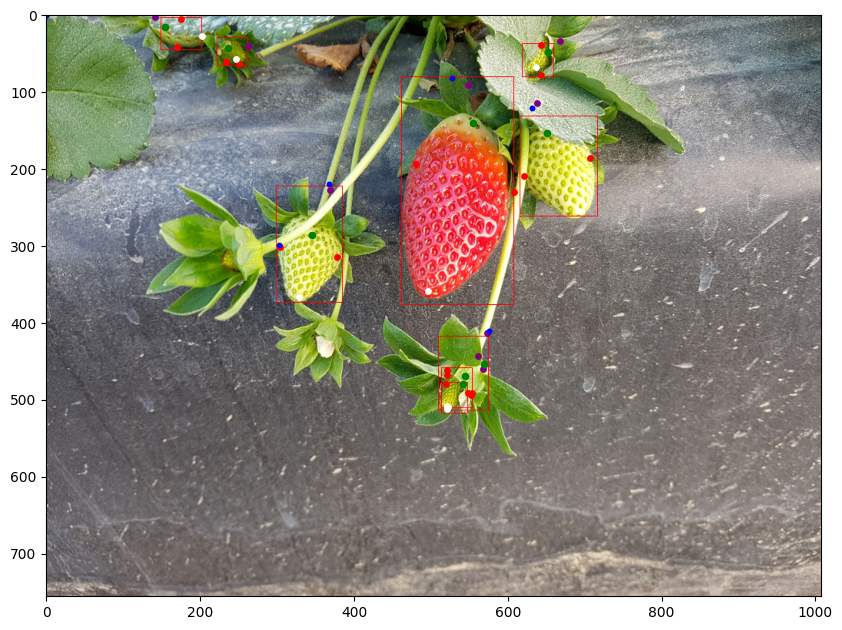

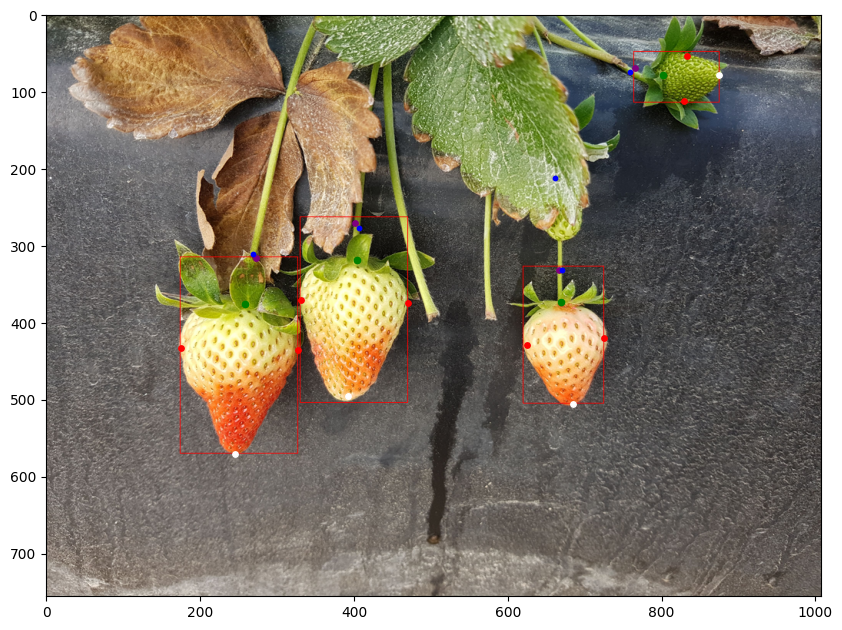

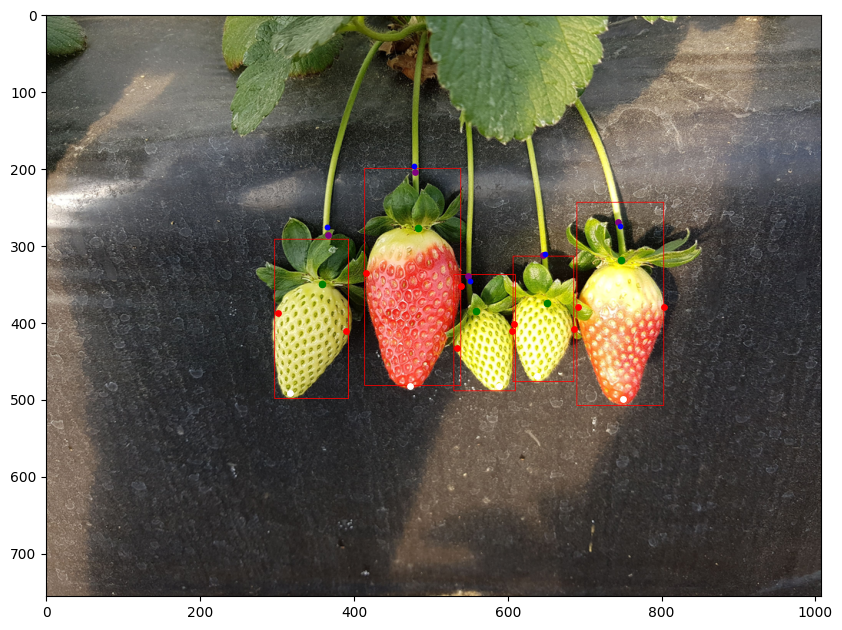

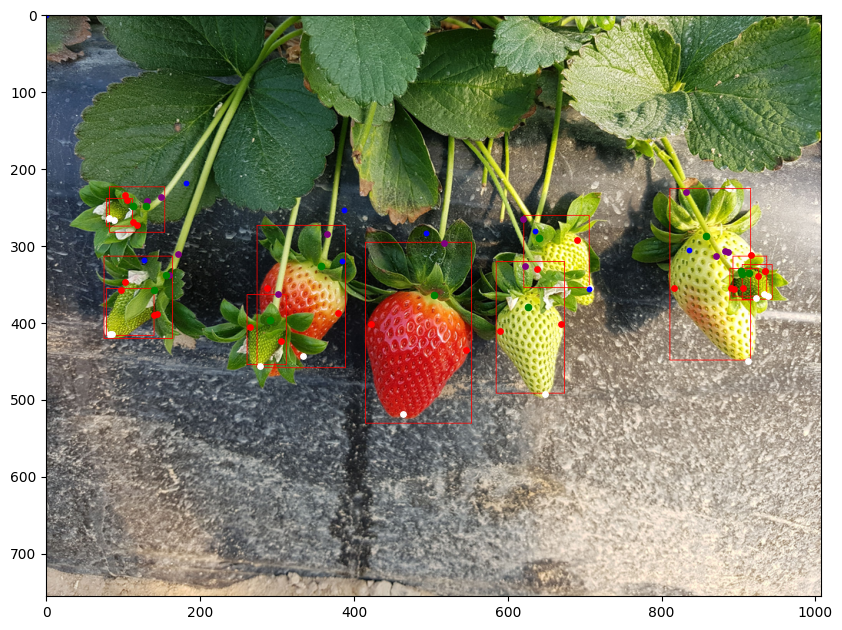

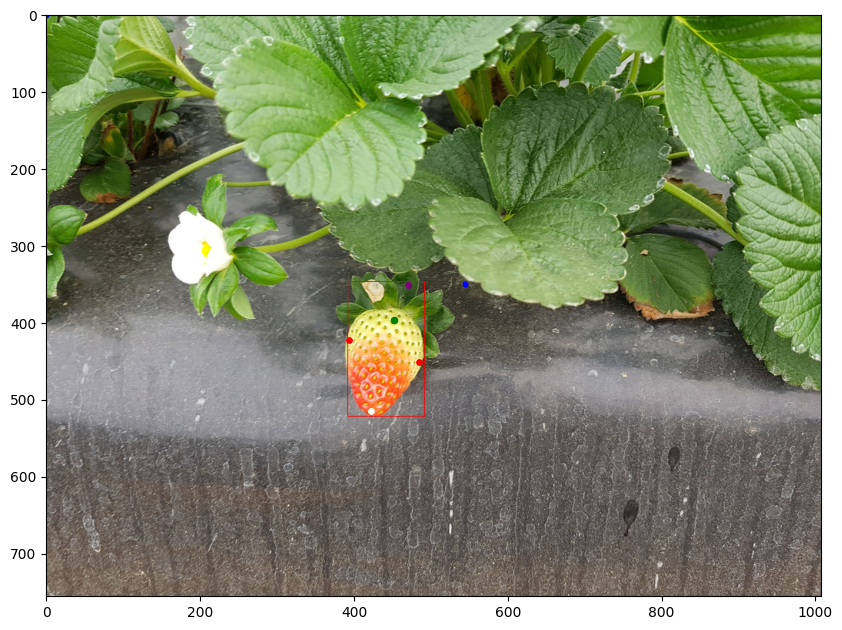

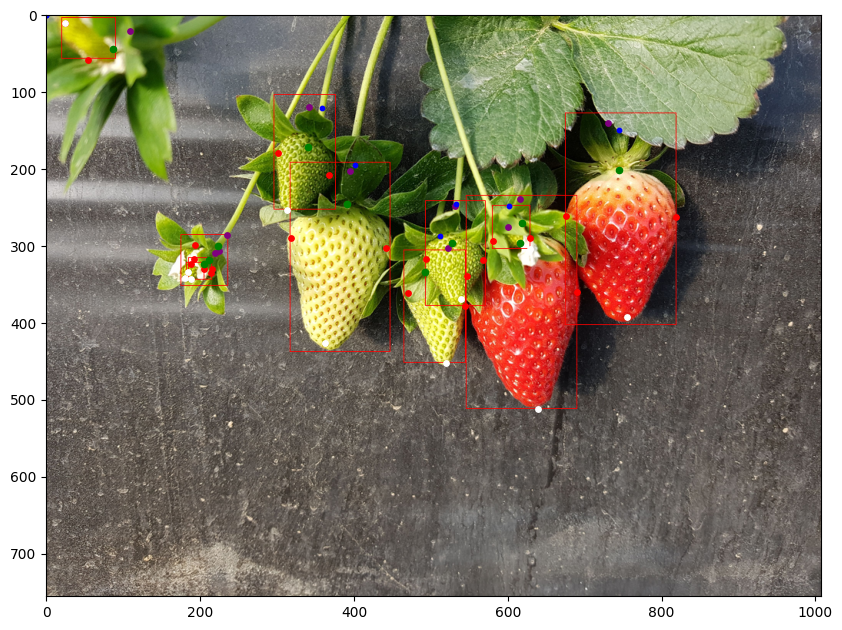

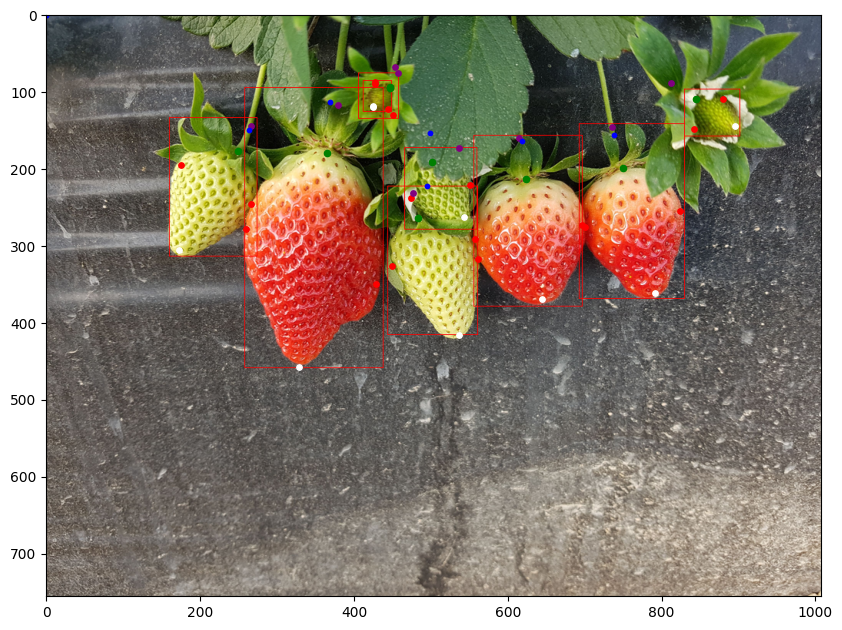

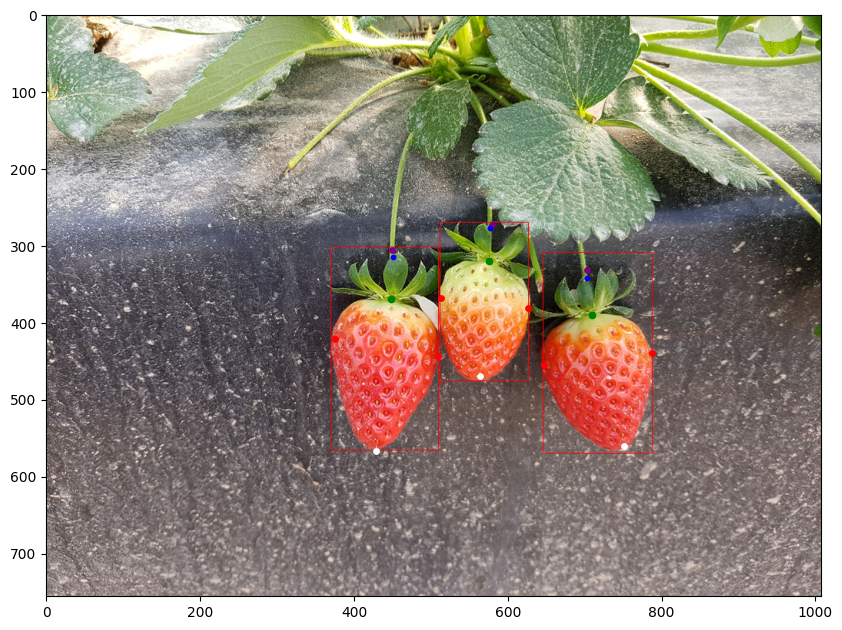

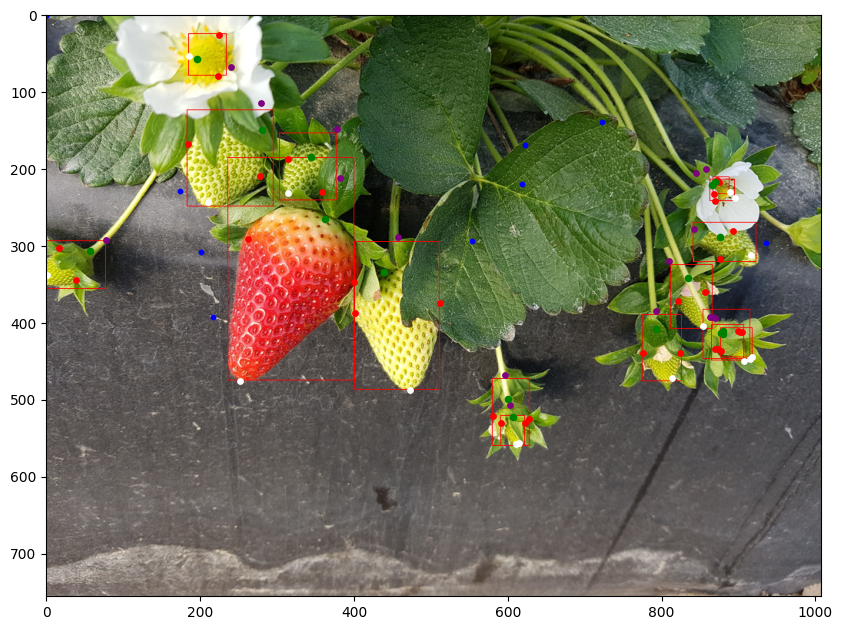

In [15]:
# test the model - for images 1 to 10
testSetTruePreds,acceptablePredictionsInDataset,sumOfPxlwiseError = testFN(1,10,True,True)

print(testSetTruePreds/acceptablePredictionsInDataset)
print(sumOfPxlwiseError/acceptablePredictionsInDataset)
print(sumOfPxlwiseError,acceptablePredictionsInDataset)